# Import Required Libraries and Modules

In [1]:
import os
import sys
import cv2
import numpy as np
import matplotlib.pyplot as plt
import albumentations as A
from pathlib import Path

# Add parent directory
parent_dir = os.path.dirname(os.getcwd())
sys.path.append(parent_dir)

from core_code.image_processing_config import get_image_processor_training_config

# Configuration

In [2]:
# Get image processing configuration from the centeralized configuration
config = get_image_processor_training_config()
        
# Create variables from config dictionary so they can be used throughout the notebook
globals().update(config)

# Path to test image
IMAGE_PATH = "../core_code/saved_images/run_2025-12-29_10-59-53/raw_images/raw_frame_00001000.png"

# Number of samples to generate for each augmentation type
NUM_SAMPLES = 5

# Augmentation Definition

In [3]:
def get_all_augmentations():
    """Return dictionary of all available augmentations using config parameters"""
    
    augmentations = {
        # Motion Blur
        "motion_blur": A.MotionBlur(
            blur_limit=(motion_blur_limit_min, motion_blur_limit_max),
            allow_shifted=True,
            p=1.0
        ),
        
        # Lens Distortion (barrel distortion from IMX219)
        "lens_distortion": A.OpticalDistortion(
            distort_limit=(lens_distortion_min, lens_distortion_max),
            shift_limit=lens_distortion_shift,
            border_mode=cv2.BORDER_REPLICATE,
            p=1.0
        ),
        
        # Horizontal Translation
        "horizontal_translation": A.ShiftScaleRotate(
            shift_limit_x=(translation_x_min, translation_x_max),
            shift_limit_y=0,
            scale_limit=0,
            rotate_limit=0,
            border_mode=cv2.BORDER_REPLICATE,
            p=1.0
        ),
        
        # Rotation
        "rotation": A.Rotate(
            limit=(rotation_angle_min, rotation_angle_max),
            border_mode=cv2.BORDER_REPLICATE,
            p=1.0
        ),
        
        # Shadow Casting
        "shadow_cast": A.RandomShadow(
            shadow_roi=shadow_roi,
            num_shadows_lower=number_of_shadows_min,
            num_shadows_upper=number_of_shadows_max,
            shadow_dimension=shadow_dimension,
            p=1.0
        ),
        
        # Color Jitter
        "color_jitter": A.ColorJitter(
            brightness=brightness,
            contrast=contrast,
            saturation=saturation,
            hue=hue,
            p=1.0
        ),
        
        # Brightness & Contrast
        "brightness_contrast": A.RandomBrightnessContrast(
            brightness_limit=(brightness_min, brightness_max),
            contrast_limit=(contrast_min, contrast_max),
            p=1.0
        ),
        
        # RGB Color Shift
        "color_shift": A.RGBShift(
            r_shift_limit=(color_shift_min, color_shift_max),
            g_shift_limit=(color_shift_min, color_shift_max),
            b_shift_limit=(color_shift_min, color_shift_max),
            p=1.0
        ),
        
        # Gaussian Noise
        "gaussian_noise": A.GaussNoise(
            var_limit=(noise_var_min, noise_var_max),
            per_channel=True,
            p=1.0
        ),
    
        # Elastic Transform (track mat wrinkles)
        "elastic_transform": A.ElasticTransform(
            alpha=elastic_alpha,
            sigma=elastic_sigma,
            alpha_affine=elastic_alpha_affine,
            approximate=True,
            border_mode=cv2.BORDER_REPLICATE,
            p=1.0
        ),
        
        # Grid Distortion (surface irregularities)
        "grid_distortion": A.GridDistortion(
            num_steps=grid_num_steps,
            distort_limit=grid_distort_limit,
            border_mode=cv2.BORDER_REPLICATE,
            p=1.0
        ),
    }
    
    return augmentations

# Image Loading and Data Augmentation

In [4]:
def load_image(image_path):
    """Load image from file"""
    img = cv2.imread(str(image_path))
    if img is None:
        raise ValueError(f"Could not load image from {image_path}")
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img_rgb


def apply_augmentation(image, augmentation):
    """Apply augmentation to image"""
    transformed = augmentation(image=image)
    return transformed['image']

# Visualization

In [5]:
def visualize_augmentation(original, augmentation, aug_name, num_samples=5):
    """Display original and multiple augmented samples in a grid and save each separately to a .png file"""
    
    # Create output directory
    output_dir = "data_augmentation_samples"
    os.makedirs(output_dir, exist_ok=True)
    
    # Save original image
    original_path = os.path.join(output_dir, f"{aug_name}_original.png")
    fig_orig = plt.figure(figsize=(original.shape[1]/100, original.shape[0]/100))
    plt.imshow(original)
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.savefig(original_path, dpi=300, bbox_inches='tight', pad_inches=0)
    plt.close(fig_orig)
    print(f"💾 Saved: {original_path}")
    
    # Create grid: 2 rows, 3 columns
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()
    
    # Show original in first position
    axes[0].imshow(original)
    axes[0].set_title('Original Image', fontsize=12, fontweight='bold', color='green')
    axes[0].axis('off')
    axes[0].set_facecolor('#f0f0f0')
    
    # Generate and save augmented samples
    for i in range(1, num_samples + 1):
        augmented = apply_augmentation(original, augmentation)
        
        # Save individual augmented images
        aug_path = os.path.join(output_dir, f"{aug_name}_{i}.png")
        fig_aug = plt.figure(figsize=(augmented.shape[1]/100, augmented.shape[0]/100))
        plt.imshow(augmented)
        plt.axis('off')
        plt.tight_layout(pad=0)
        plt.savefig(aug_path, dpi=300, bbox_inches='tight', pad_inches=0)
        plt.close(fig_aug)
        print(f"💾 Saved: {aug_path}")
        
        # Display in grid
        axes[i].imshow(augmented)
        axes[i].set_title(f'{aug_name} {i}', fontsize=11)
        axes[i].axis('off')
    
    # Hide unused subplot (if any)
    if len(axes) > num_samples + 1:
        axes[-1].axis('off')
    
    # Main title
    fig.suptitle(f'Augmentation: {aug_name.replace("_", " ").title()}', 
                 fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout()
    plt.show()
    
    print(f"✅ Completed: {aug_name}")
    print("-" * 70)

# Main Execution Loop

In [6]:
def test_augmentations(image_path, num_samples=5):
    """
    Test augmentations
    
    Args:
        image_path: Path to test image
        num_samples: Number of samples to generate per augmentation
    """
    
    # Load test image
    print(f"📖 Loading image: {image_path}")
    original_image = load_image(image_path)
    print(f"✅ Image loaded successfully. Shape: {original_image.shape}\n")
    
    # Get all augmentations
    all_augmentations = get_all_augmentations()
        
    print("=" * 70)
    
    # FOR LOOP - Test each augmentation
    for idx, (aug_name, augmentation) in enumerate(all_augmentations.items(), 1):
        print(f"\n[{idx}/{len(all_augmentations)}] Testing: {aug_name.replace('_', ' ').title()}")
        print("-" * 70)
        
        try:
            visualize_augmentation(
                original_image, 
                augmentation, 
                aug_name, 
                num_samples=num_samples
            )
        except Exception as e:
            print(f"❌ Error with {aug_name}: {e}")
            print("-" * 70)
    
    print("\n" + "=" * 70)
    print(f"🎉 Tested {len(all_augmentations)} augmentations")
    print("=" * 70)

📖 Loading image: ../core_code/saved_images/run_2025-12-29_10-59-53/raw_images/raw_frame_00001000.png
✅ Image loaded successfully. Shape: (120, 160, 3)


[1/11] Testing: Motion Blur
----------------------------------------------------------------------
💾 Saved: data_augmentation_samples/motion_blur_original.png
💾 Saved: data_augmentation_samples/motion_blur_1.png
💾 Saved: data_augmentation_samples/motion_blur_2.png
💾 Saved: data_augmentation_samples/motion_blur_3.png
💾 Saved: data_augmentation_samples/motion_blur_4.png


/var/folders/ps/9s1tgd8j25zbfws673ws37sr0000gn/T/ipykernel_71050/1420844780.py:13: UserWarning: Argument(s) 'shift_limit' are not valid for transform OpticalDistortion
  "lens_distortion": A.OpticalDistortion(
/opt/anaconda3/envs/donkey_2/lib/python3.11/site-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
/var/folders/ps/9s1tgd8j25zbfws673ws37sr0000gn/T/ipykernel_71050/1420844780.py:38: UserWarning: Argument(s) 'num_shadows_lower, num_shadows_upper' are not valid for transform RandomShadow
  "shadow_cast": A.RandomShadow(
/var/folders/ps/9s1tgd8j25zbfws673ws37sr0000gn/T/ipykernel_71050/1420844780.py:71: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  "gaussian_noise": A.GaussNoise(
/var/folders/ps/9s1tgd8j25zbfws673ws37sr0000gn/T/ipykernel_71050/1420844780.py:78: UserWarning: Argument(s) 'alpha_affine' are not 

💾 Saved: data_augmentation_samples/motion_blur_5.png


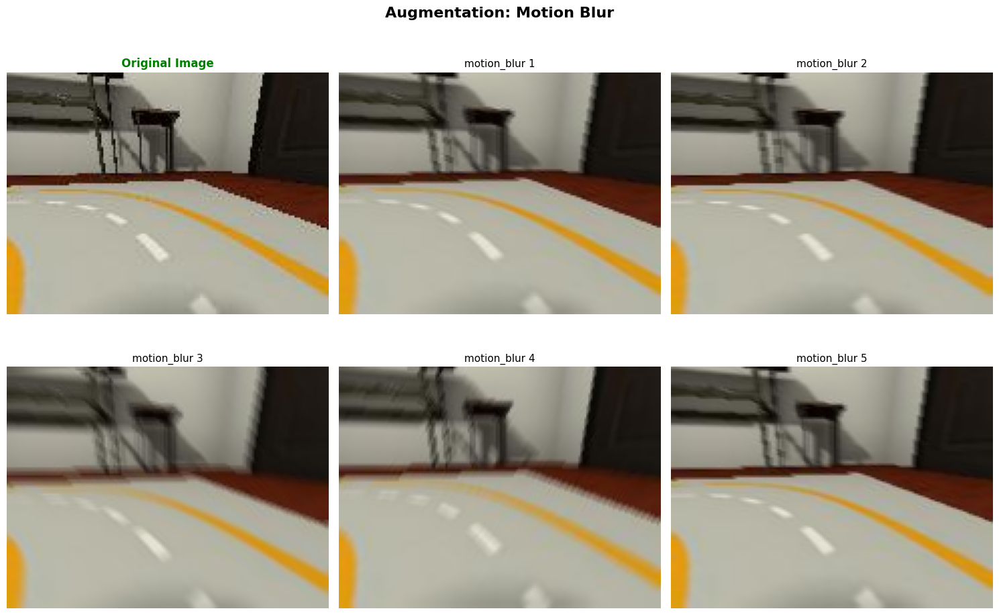

✅ Completed: motion_blur
----------------------------------------------------------------------

[2/11] Testing: Lens Distortion
----------------------------------------------------------------------
💾 Saved: data_augmentation_samples/lens_distortion_original.png
💾 Saved: data_augmentation_samples/lens_distortion_1.png
💾 Saved: data_augmentation_samples/lens_distortion_2.png
💾 Saved: data_augmentation_samples/lens_distortion_3.png
💾 Saved: data_augmentation_samples/lens_distortion_4.png
💾 Saved: data_augmentation_samples/lens_distortion_5.png


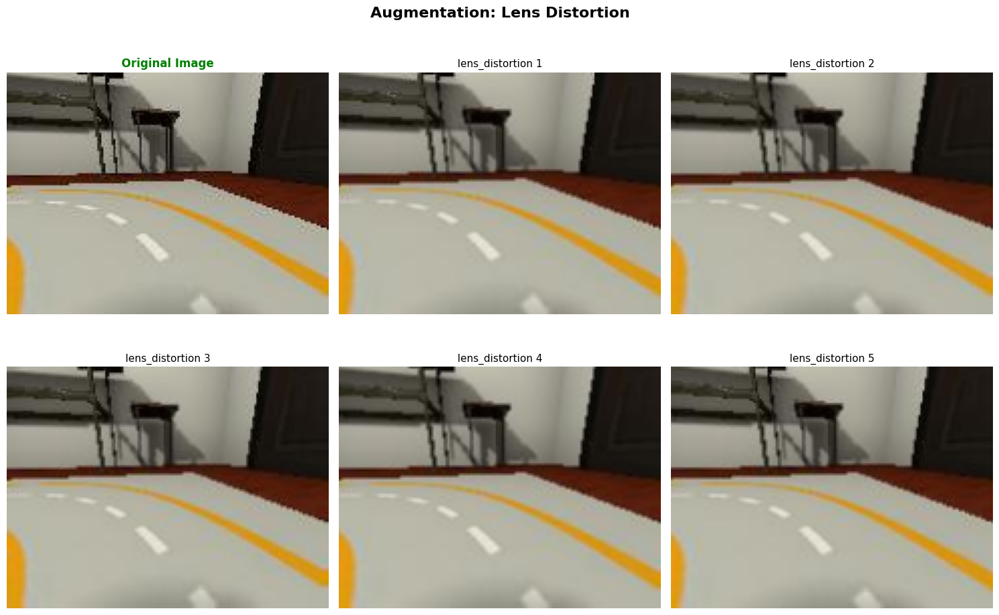

✅ Completed: lens_distortion
----------------------------------------------------------------------

[3/11] Testing: Horizontal Translation
----------------------------------------------------------------------
💾 Saved: data_augmentation_samples/horizontal_translation_original.png
💾 Saved: data_augmentation_samples/horizontal_translation_1.png
💾 Saved: data_augmentation_samples/horizontal_translation_2.png
💾 Saved: data_augmentation_samples/horizontal_translation_3.png
💾 Saved: data_augmentation_samples/horizontal_translation_4.png
💾 Saved: data_augmentation_samples/horizontal_translation_5.png


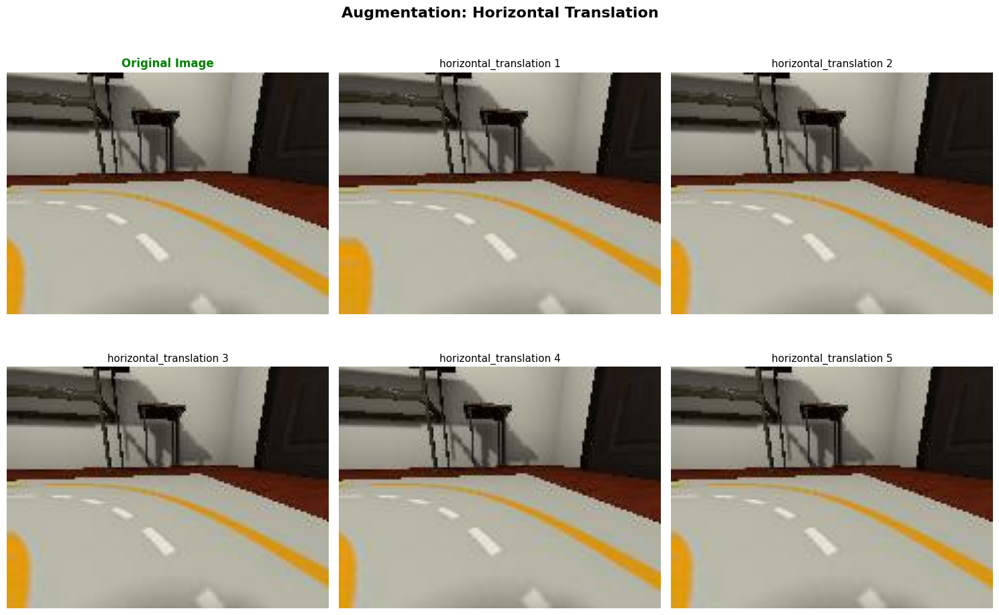

✅ Completed: horizontal_translation
----------------------------------------------------------------------

[4/11] Testing: Rotation
----------------------------------------------------------------------
💾 Saved: data_augmentation_samples/rotation_original.png
💾 Saved: data_augmentation_samples/rotation_1.png
💾 Saved: data_augmentation_samples/rotation_2.png
💾 Saved: data_augmentation_samples/rotation_3.png
💾 Saved: data_augmentation_samples/rotation_4.png
💾 Saved: data_augmentation_samples/rotation_5.png


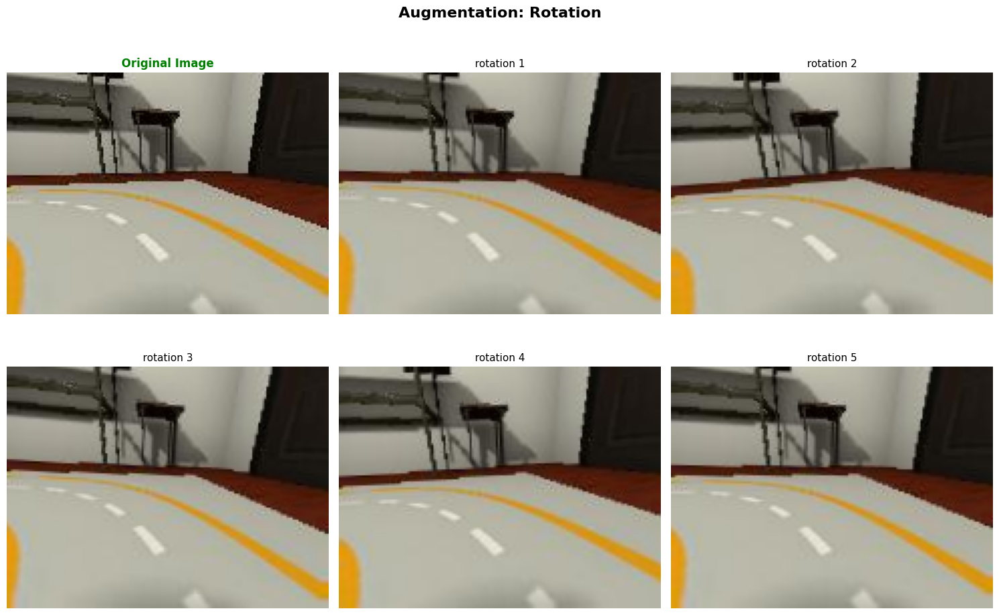

✅ Completed: rotation
----------------------------------------------------------------------

[5/11] Testing: Shadow Cast
----------------------------------------------------------------------
💾 Saved: data_augmentation_samples/shadow_cast_original.png
💾 Saved: data_augmentation_samples/shadow_cast_1.png
💾 Saved: data_augmentation_samples/shadow_cast_2.png
💾 Saved: data_augmentation_samples/shadow_cast_3.png
💾 Saved: data_augmentation_samples/shadow_cast_4.png
💾 Saved: data_augmentation_samples/shadow_cast_5.png


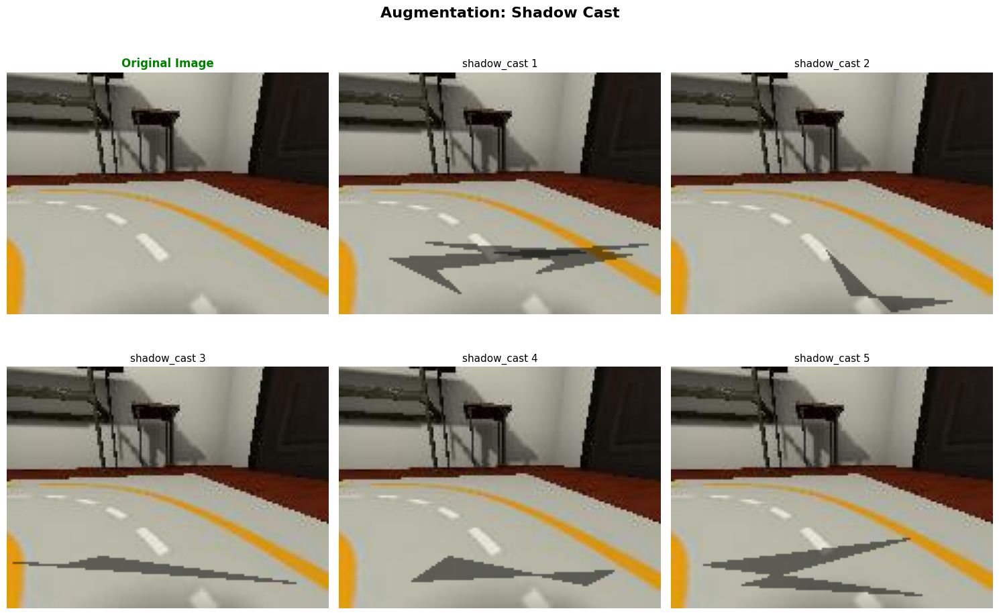

✅ Completed: shadow_cast
----------------------------------------------------------------------

[6/11] Testing: Color Jitter
----------------------------------------------------------------------
💾 Saved: data_augmentation_samples/color_jitter_original.png
💾 Saved: data_augmentation_samples/color_jitter_1.png
💾 Saved: data_augmentation_samples/color_jitter_2.png
💾 Saved: data_augmentation_samples/color_jitter_3.png
💾 Saved: data_augmentation_samples/color_jitter_4.png
💾 Saved: data_augmentation_samples/color_jitter_5.png


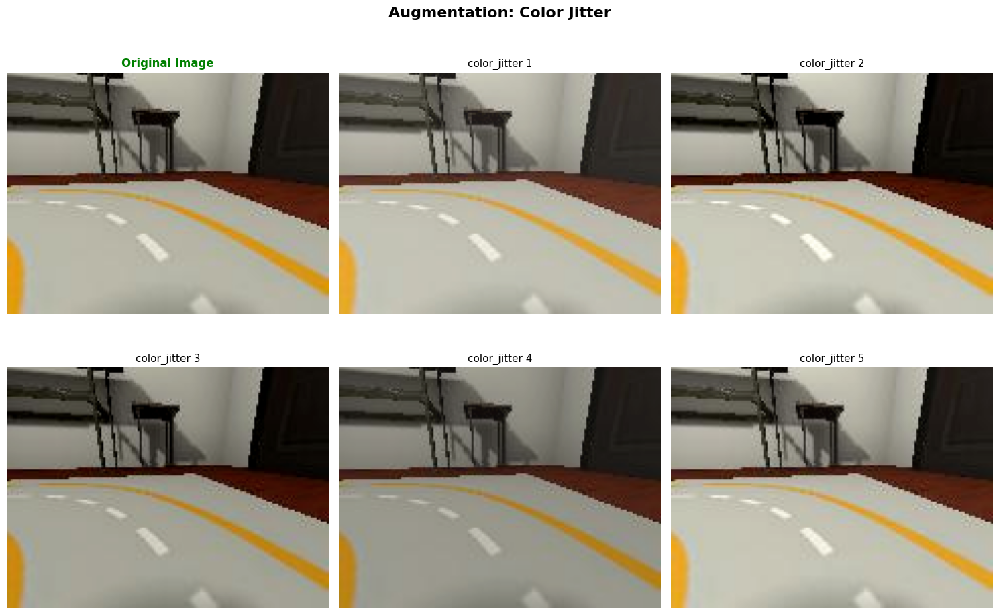

✅ Completed: color_jitter
----------------------------------------------------------------------

[7/11] Testing: Brightness Contrast
----------------------------------------------------------------------
💾 Saved: data_augmentation_samples/brightness_contrast_original.png
💾 Saved: data_augmentation_samples/brightness_contrast_1.png
💾 Saved: data_augmentation_samples/brightness_contrast_2.png
💾 Saved: data_augmentation_samples/brightness_contrast_3.png
💾 Saved: data_augmentation_samples/brightness_contrast_4.png
💾 Saved: data_augmentation_samples/brightness_contrast_5.png


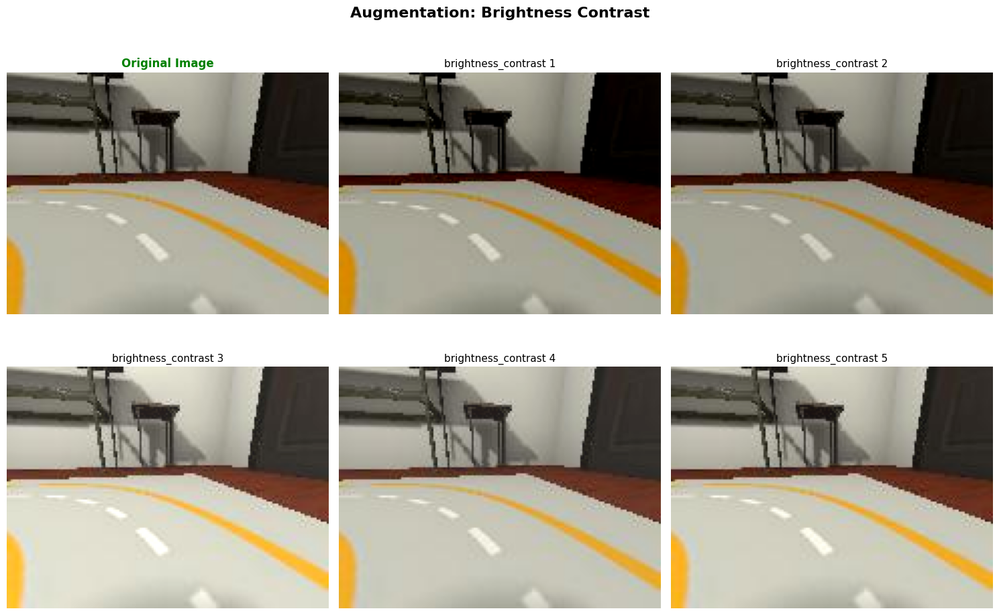

✅ Completed: brightness_contrast
----------------------------------------------------------------------

[8/11] Testing: Color Shift
----------------------------------------------------------------------
💾 Saved: data_augmentation_samples/color_shift_original.png
💾 Saved: data_augmentation_samples/color_shift_1.png
💾 Saved: data_augmentation_samples/color_shift_2.png
💾 Saved: data_augmentation_samples/color_shift_3.png
💾 Saved: data_augmentation_samples/color_shift_4.png
💾 Saved: data_augmentation_samples/color_shift_5.png


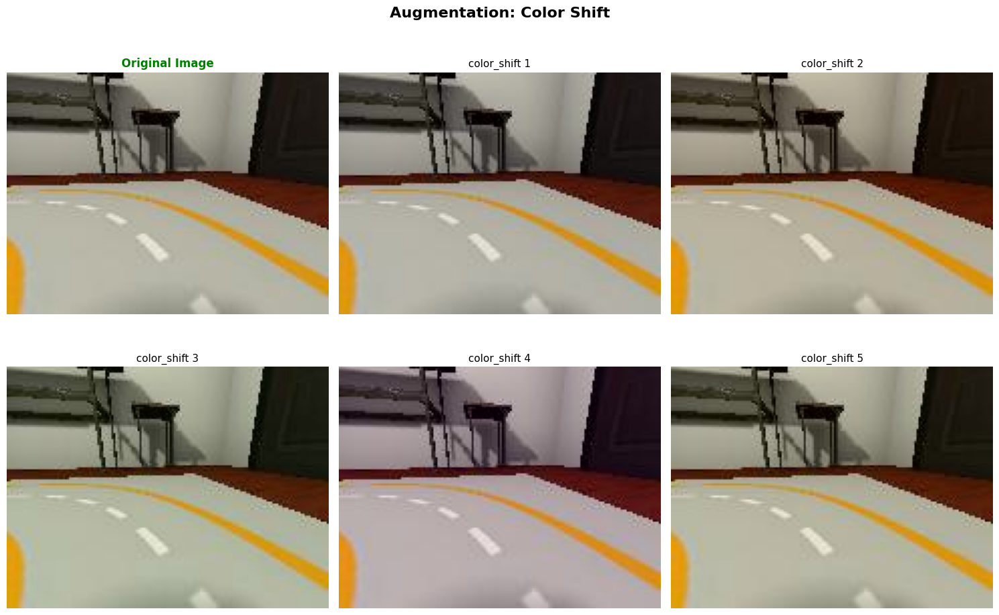

✅ Completed: color_shift
----------------------------------------------------------------------

[9/11] Testing: Gaussian Noise
----------------------------------------------------------------------
💾 Saved: data_augmentation_samples/gaussian_noise_original.png
💾 Saved: data_augmentation_samples/gaussian_noise_1.png
💾 Saved: data_augmentation_samples/gaussian_noise_2.png
💾 Saved: data_augmentation_samples/gaussian_noise_3.png
💾 Saved: data_augmentation_samples/gaussian_noise_4.png
💾 Saved: data_augmentation_samples/gaussian_noise_5.png


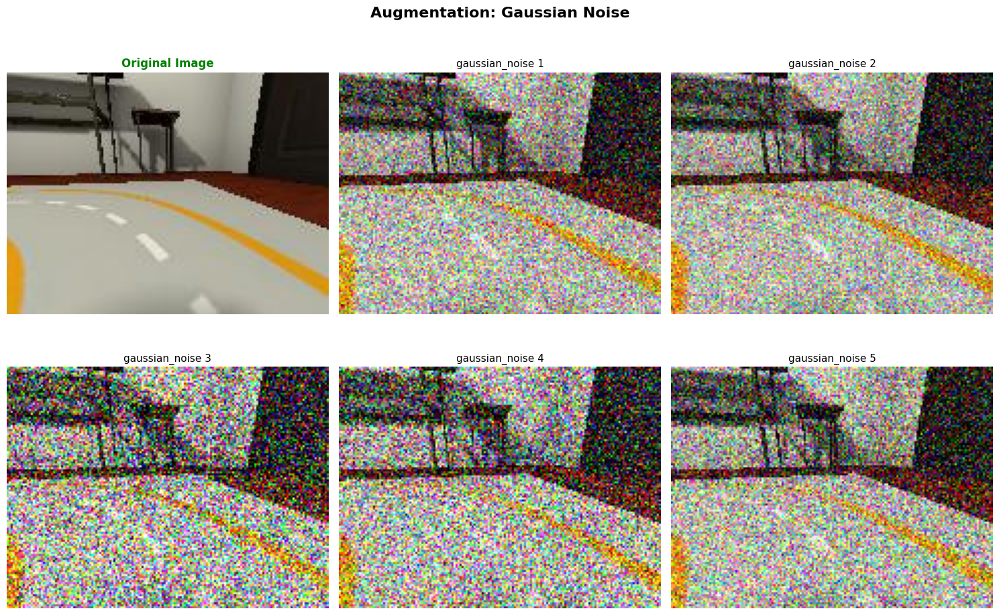

✅ Completed: gaussian_noise
----------------------------------------------------------------------

[10/11] Testing: Elastic Transform
----------------------------------------------------------------------
💾 Saved: data_augmentation_samples/elastic_transform_original.png
💾 Saved: data_augmentation_samples/elastic_transform_1.png
💾 Saved: data_augmentation_samples/elastic_transform_2.png
💾 Saved: data_augmentation_samples/elastic_transform_3.png
💾 Saved: data_augmentation_samples/elastic_transform_4.png
💾 Saved: data_augmentation_samples/elastic_transform_5.png


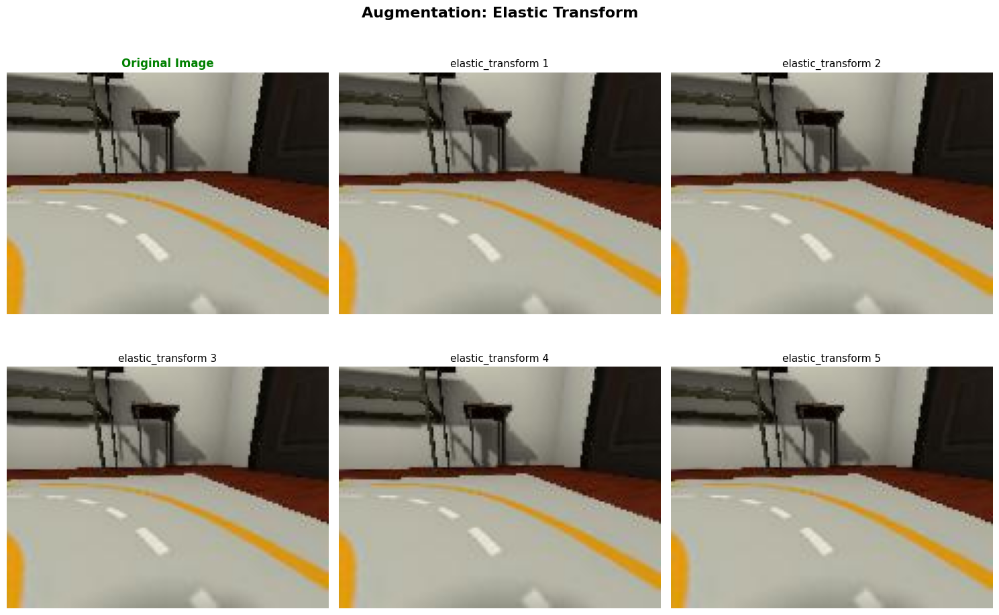

✅ Completed: elastic_transform
----------------------------------------------------------------------

[11/11] Testing: Grid Distortion
----------------------------------------------------------------------
💾 Saved: data_augmentation_samples/grid_distortion_original.png
💾 Saved: data_augmentation_samples/grid_distortion_1.png
💾 Saved: data_augmentation_samples/grid_distortion_2.png
💾 Saved: data_augmentation_samples/grid_distortion_3.png
💾 Saved: data_augmentation_samples/grid_distortion_4.png
💾 Saved: data_augmentation_samples/grid_distortion_5.png


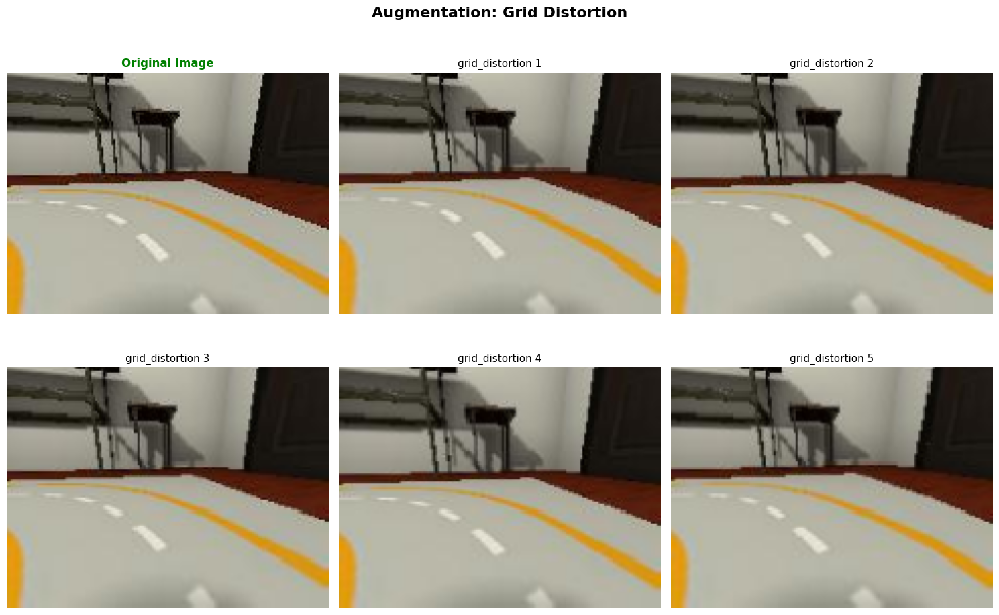

✅ Completed: grid_distortion
----------------------------------------------------------------------

🎉 Tested 11 augmentations


In [7]:
test_augmentations(
    image_path=IMAGE_PATH,
    num_samples=NUM_SAMPLES
)